In [ ]:
!pip install deepface

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 87.2/87.2 kB 3.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 108.6/108.6 kB 4.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.0/85.0 kB 3.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 31.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 30.0 MB/s eta 0:00:00
  Created wheel for fire: filename=fire-0.7.0-py3-none-any.whl size=114249 sha256=77558073443d1920a11b80cdb4d4ae14532892ed6d270eb18d98590cdcb0e55c
  Stored in directory: /root/.cache/pip/wheels/46/54/24/1624fd5b8674eb1188623f7e8e17cdf7c0f6c24b609dfb8a89
Successfully built fire


In [ ]:
models = [
  "VGG-Face",
  "Facenet",
  "Facenet512",
  "OpenFace",
  "DeepFace",
  "DeepID",
  "ArcFace",
  "Dlib",
  "SFace",
  "GhostFaceNet"
]
backends = [
  'opencv',
  'ssd',
  'dlib',
  'mtcnn',
  'fastmtcnn',
  'retinaface',
  'mediapipe',
  'yolov8',
  'yolov11s',
  'yolov11n',
  'yolov11m',
  'yunet',
  'centerface',
]

In [ ]:
embedding_objs = DeepFace.represent(
      img_path = "/content/demo 5.jpg",model_name=models[2]
    )

In [ ]:
print(embedding_objs)
print(type(embedding_objs[0]['embedding']))

[{'embedding': [0.40086886286735535, 0.5852367281913757, 0.4591211974620819, 0.6566207408905029, -0.16973084211349487, 0.3415408730506897, 1.5582866668701172, 0.46539512276649475, 0.4458266496658325, 0.07630491256713867, -1.1508898735046387, -0.05299209803342819, 0.3366871178150177, 1.3276768922805786, 0.30322930216789246, -0.9994525909423828, -0.8481531739234924, -1.9187767505645752, -0.8271007537841797, -0.2415189892053604, -0.14410269260406494, 1.8464839458465576, 0.09353022277355194, 0.9638053178787231, 0.062392763793468475, 2.5525400638580322, -1.4714343547821045, -0.551698625087738, 0.20699574053287506, -0.24050095677375793, -0.3353129029273987, 1.5380624532699585, 0.4463968276977539, -2.812828779220581, 0.39252305030822754, 0.44598016142845154, 0.6185770034790039, 0.29607921838760376, 1.0227532386779785, -1.0183627605438232, -0.10192647576332092, 1.6532249450683594, -0.9953983426094055, -1.2361226081848145, -0.2836754620075226, -0.9539973139762878, 1.683016300201416, 0.544225037

In [ ]:
import numpy as np
from scipy.spatial.distance import cosine
import os
from deepface import DeepFace
import cv2
from collections import deque
from google.colab.patches import cv2_imshow


25-02-23 14:15:37 - Directory /root/.deepface has been created
25-02-23 14:15:37 - Directory /root/.deepface/weights has been created


In [ ]:
print(cosine([1,0],[0.1,1]))
print(cosine([1,0],[-2,0]))
sim=lambda x: 1-x/2
print(sim(cosine([1,0],[0.1,1])),sim(cosine([1,0],[-5,0])),sim(cosine([1,1],[2,2.2])))
threshold=0.75

0.900496280979001
2.0
0.5497518595104995 0.0 0.9994340688622187


In [ ]:
test_img='/content/demo 4.jpg'
embeddingTest=DeepFace.represent(test_img,model_name=models[2])
embeddingTest=[np.array(embeddingTest[i]['embedding']) for i in range(len(embeddingTest))]
ans=[]
folder_path = "/content/Anshuman"
for img_name in os.listdir(folder_path):
  img_path = os.path.join(folder_path, img_name)
  try:
    embImg=DeepFace.represent(img_path,model_name=models[2])
    embImg=[np.array(embImg[i]['embedding']) for i in range(len(embImg))]
    for i,emb1 in enumerate(embeddingTest):
      for j,emb2 in enumerate(embImg):
        similarity=sim(cosine(emb1,emb2))
        print(similarity)
        if similarity>=threshold:
          ans.append((i,j,img_path))
  except:
    continue
print(ans)





0.4364203047809645
0.4928150374231478
0.428578951347776
0.416259331510777
0.36779342796112335
0.4111039741538287
0.4896415730543996
0.5443501165117309
0.6007170149705264
0.47736116186374855
0.4080020149649939
0.4534876296978966
0.37469254146492137
0.3935977291190319
0.43742526734615794
0.5571831483729603
0.5663931177360305
0.48920258631810853
0.4634517474700405
0.46617949661826186
0.424719069555495
0.4516919303443957
0.4589026209978293
0.5380164235041023
0.6097375207810277
0.4166337498477537
0.4429577555632722
0.3911765687940829
0.43233328117322645
0.44505480194672953
0.49641109690953567
0.47439868336134394
0.5244892202439966
0.4025084714061894
0.44684538835419285
0.4226973345385596
0.40857792498946344
0.49633069555291154
0.478095829063623
0.523316767147088
[]


In [ ]:
test_img='/content/Screenshot 2022-10-24 004120.png'
profiles=DeepFace.represent(test_img,model_name=models[2],detector_backend = backends[5])
profiles=[np.array(profiles[i]['embedding']) for i in range(len(profiles))]

Downloading...
From: https://github.com/serengil/deepface_models/releases/download/v1.0/facenet512_weights.h5
To: /root/.deepface/weights/facenet512_weights.h5


25-02-23 14:16:13 - facenet512_weights.h5 will be downloaded...


100%|██████████| 95.0M/95.0M [00:00<00:00, 294MB/s]
Downloading...
From: https://github.com/serengil/deepface_models/releases/download/v1.0/retinaface.h5
To: /root/.deepface/weights/retinaface.h5


25-02-23 14:16:17 - retinaface.h5 will be downloaded from the url https://github.com/serengil/deepface_models/releases/download/v1.0/retinaface.h5


100%|██████████| 119M/119M [00:00<00:00, 264MB/s]


In [ ]:
anshuman=[]
profiles=DeepFace.represent(test_img,model_name=models[2],detector_backend = backends[5])
folder_path = "/content/Anshuman"
for img_name in os.listdir(folder_path):
  img_path = os.path.join(folder_path, img_name)
  try:
    embImg=DeepFace.represent(img_path,model_name=models[2],detector_backend = backends[5])
    embImg=[np.array(embImg[i]['embedding']) for i in range(len(embImg))]
    anshuman.append(embImg[0])
  except:
    continue

anshuman = np.mean(np.stack(anshuman), axis=0)

In [ ]:
print(type(anshuman))
profiles=[anshuman]


<class 'numpy.ndarray'>


In [ ]:
np.save('anshuman.npy',anshuman)

0.7287161735244386
0.5439468044108534
0.8522715924351516


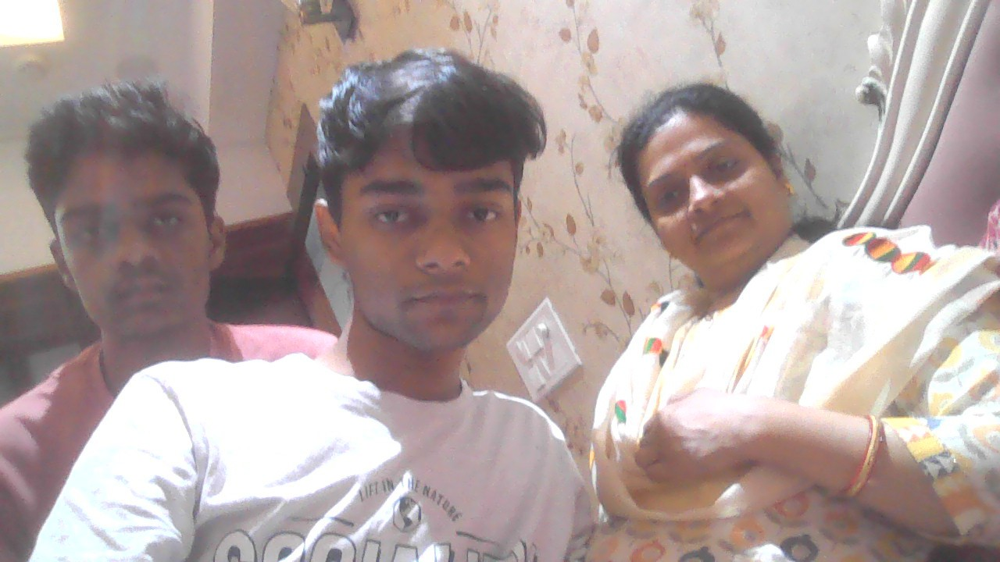

0.8910052246166869
0.8571514436946455


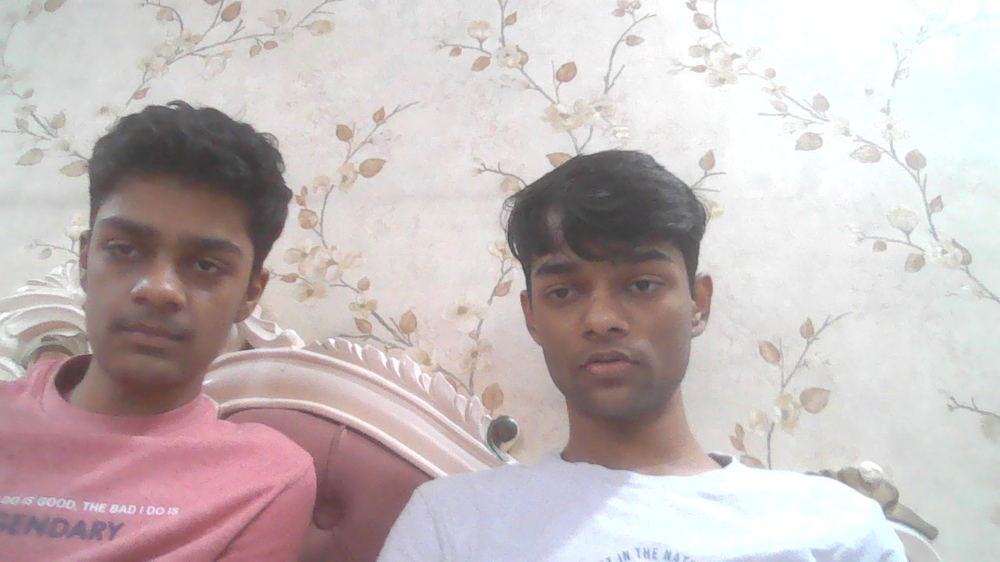

0.5829754965749046
0.3752046772194143
0.5198552028812179
0.4683672915084671
0.3843987520206411


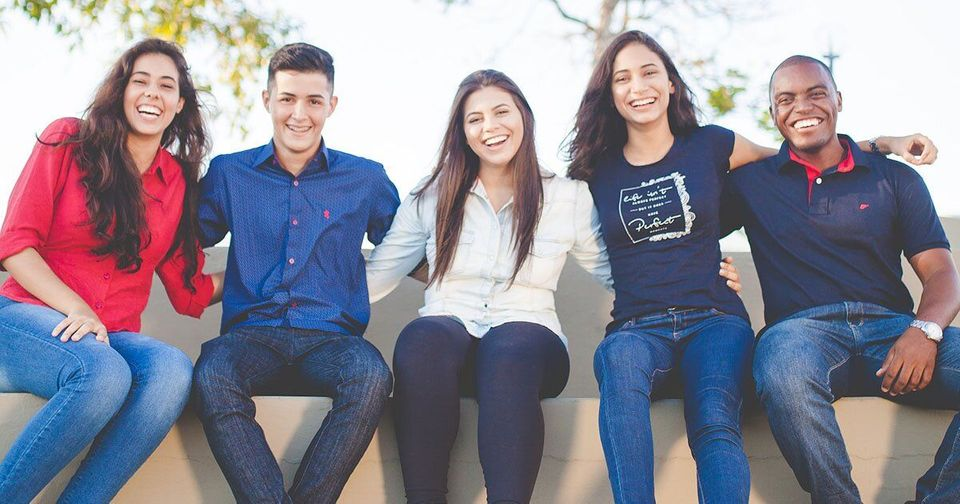

In [ ]:
for path in ['/content/WIN_20250223_19_57_51_Pro.jpg',
             '/content/WIN_20250223_17_21_52_Pro.jpg','/content/demo 3.jpg','/content/WIN_20250222_20_19_14_Pro.jpg','/content/WIN_20250222_20_19_16_Pro.jpg','/content/WIN_20250222_20_19_18_Pro.jpg']:
  try:
    check(path,profiles=profiles)
    cv2_imshow(cv2.imread(path))
  except:
    continue

In [ ]:
def check(frame,profiles=profiles):
  try:
    embeddingTest=DeepFace.represent(frame,model_name=models[2],detector_backend = backends[5])
    embeddingTest=[np.array(embeddingTest[i]['embedding']) for i in range(len(embeddingTest))]
    for a in embeddingTest:
      for b in profiles:
        print(sim(cosine(a,b)))
    return any(sim((cosine(a,b)))>=0.77 for a in embeddingTest for b in profiles)
  except:
    return False
def detect_motion(frame1, frame2, threshold=30):
    """
    Detect motion using frame differencing.
    """
    diff = cv2.absdiff(frame1, frame2)
    _, thresh = cv2.threshold(diff, threshold, 255, cv2.THRESH_BINARY)
    return np.sum(thresh)/thresh.size > 25
   # return np.count_nonzero(thresh) > 500  # Motion detected if pixel count exceeds threshold

def process_video(video_path):
    cap = cv2.VideoCapture(video_path)
    frame_queue = deque(maxlen=10)  # Store last 10 frames (one per second)
    recent_checked_frame=[False,0]#frame,frameNo,true/false vals for prev 10
    fps = int(cap.get(cv2.CAP_PROP_FPS))
    frame_interval = fps  # One frame per second
    prev_frame = None
    frame_no = 0

    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        if frame_no % frame_interval == 0:  # Process once per second
            print('s',check(frame))
            cv2_imshow(frame)


        frame_no += 1

    cap.release()
    cv2.destroyAllWindows()

# Run on a sample video

process_video('/content/vid gate 1.mp4')

In [ ]:
import cv2
import numpy as np

# Load video
video_path = "/content/WIN_20250221_20_05_50_Pro.mp4"
cap = cv2.VideoCapture(video_path)

motion_seconds = []  # Stores seconds where motion is detected
frame_rate = int(cap.get(cv2.CAP_PROP_FPS))  # Get frames per second
prev_frame = None
second_no = 0

while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    # Process only one frame per second
    frame_no = int(cap.get(cv2.CAP_PROP_POS_FRAMES))
    if frame_no % frame_rate == 0:
        gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
        gray = cv2.GaussianBlur(gray, (5, 5), 0)

        if prev_frame is not None:
            diff = cv2.absdiff(prev_frame, gray)
            _, thresh = cv2.threshold(diff, 30, 255, cv2.THRESH_BINARY)
            motion = np.sum(thresh)/thresh.size > 25  # Adjust threshold as needed

            if motion:
                motion_seconds.append(second_no)

        prev_frame = gray
        second_no += 1

cap.release()
cv2.destroyAllWindows()

# Print the list of seconds where motion was detected
print("Motion detected at seconds:", motion_seconds)


Motion detected at seconds: [7, 8, 9, 11, 12, 13, 15, 16, 17, 18, 20, 21]


In [ ]:
import pandas as pd

def average_acceleration(
    input_excel: str,
    output_csv: str = "averaged_data.csv",
    time_interval: float = 1.0,
    start_after: float = 0.0
) -> None:
    df = pd.read_csv(input_excel)

    df = df[df["seconds_elapsed"] >= start_after]

    if df.empty:
        print("No data available after the specified start time.")
        return

    start_time = df.iloc[0, 0]
    temp_data = []
    result = []

    for _, row in df.iterrows():
        if row["seconds_elapsed"] - start_time >= time_interval:
            avg_time = sum(d[0] for d in temp_data) / len(temp_data)
            avg_z = sum(d[1] for d in temp_data) / len(temp_data)
            avg_y = sum(d[2] for d in temp_data) / len(temp_data)
            avg_x = sum(d[3] for d in temp_data) / len(temp_data)

            result.append([avg_time, avg_z, avg_y, avg_x])
            start_time = row["seconds_elapsed"]
            temp_data = []

        temp_data.append([row["seconds_elapsed"], row["z"], row["y"], row["x"]])

    if temp_data:
        avg_time = sum(d[0] for d in temp_data) / len(temp_data)
        avg_z = sum(d[1] for d in temp_data) / len(temp_data)
        avg_y = sum(d[2] for d in temp_data) / len(temp_data)
        avg_x = sum(d[3] for d in temp_data) / len(temp_data)

        result.append([avg_time, avg_z, avg_y, avg_x])

    avg_df = pd.DataFrame(result, columns=["seconds_elapsed", "z", "y", "x"])
    avg_df.to_csv(output_csv, index=False)
average_acceleration('/content/project.csv',start_after=15)



In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import make_interp_spline

def plot_csv_chart(file_path):
    """
    Reads a CSV file and plots both a discrete line chart (with points) and a smooth curve.
    The first column is used as the X-axis, and the rest are plotted as Y-values.

    :param file_path: Path to the CSV file
    """
    # Load CSV file
    df = pd.read_csv(file_path)

    # Ensure there are at least two columns
    if df.shape[1] < 2:
        print("CSV file must have at least two columns (X and at least one Y).")
        return

    # Extract X and Y values

    if df.shape[1] == 4:
      x = df.iloc[:, 0]  # First column as X-axis
      y_columns = df.columns[1:]  # Remaining columns as Y-axis
    else:
      x = df.iloc[:, -4]  # Use the 4th last column as X-axis
      y_columns = df.columns[-3:]  # Use the last 3 columns as Y-axis
    # Plot setup
    plt.figure(figsize=(10, 6))

    for col in y_columns:
        y = df[col]

        # Plot discrete points with a line
        plt.plot(x, y, marker='o', linestyle='--', label=f"{col} (Discrete)", alpha=0.6)

        # Generate smooth curve
        x_smooth = np.linspace(min(x), max(x), 300)  # Generate more X points for smooth curve
        spl = make_interp_spline(x, y, k=3)  # Cubic spline interpolation
        y_smooth = spl(x_smooth)

        # Plot smooth curve
        plt.plot(x_smooth, y_smooth, label=f"{col} (Smooth)", linewidth=2)

    # Customizations
    plt.xlabel(df.columns[0])  # X-axis label
    plt.ylabel("Values")  # Y-axis label
    plt.title("Chart with Both Discrete Points and Smooth Curves")
    plt.legend()  # Show legend
    plt.grid(True)  # Add grid

    # Show the plot
    plt.show()

# Example usage:
# plot_csv_chart("your_file.csv")

# Example usage:
plot_csv_chart("averaged_data.csv")


FileNotFoundError: [Errno 2] No such file or directory: 'averaged_data.csv'

In [ ]:
def check(frame,profiles=profiles):
  try:
    embeddingTest=DeepFace.represent(frame,model_name=models[2],detector_backend = backends[5])
    embeddingTest=[np.array(embeddingTest[i]['embedding']) for i in range(len(embeddingTest))]
    for a in embeddingTest:
      for b in profiles:
        print(sim(cosine(a,b)))
    return any(sim((cosine(a,b)))>=0.77 for a in embeddingTest for b in profiles)
  except:
    return False
def detect_motion(frame1, frame2, threshold=30):
    """
    Detect motion using frame differencing.
    """
    diff = cv2.absdiff(frame1, frame2)
    _, thresh = cv2.threshold(diff, threshold, 255, cv2.THRESH_BINARY)
    return np.sum(thresh)/thresh.size > 25
   # return np.count_nonzero(thresh) > 500  # Motion detected if pixel count exceeds threshold

def process_video(video_path):
    cap = cv2.VideoCapture(video_path)
    frame_queue = deque(maxlen=10)  # Store last 10 frames (one per second)
    recent_checked_frame=[False,0]#frame,frameNo,true/false vals for prev 10
    fps = int(cap.get(cv2.CAP_PROP_FPS))
    frame_interval = fps  # One frame per second
    prev_frame = None
    frame_no = 0

    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        if frame_no % frame_interval == 0:  # Process once per second
            #print('s',check(frame))
            #cv2_imshow(frame)
            gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
            gray = cv2.GaussianBlur(gray, (5, 5), 0)
            if prev_frame is not None and detect_motion(prev_frame, gray):
                print(f"Motion detected at second {frame_no // fps}")
                true_count = 0
                if recent_checked_frame[0] is not False and frame_no-recent_checked_frame[0]<=fps*10:
                  continue
                else:
                  for frame in frame_queue:
                      if check(frame):
                         # print(f"Motion detected at second {frame_no // fps}")
                          true_count += 1
                          if true_count >=3:
                              print('valid entry')
                              break  # Stop checking further

                  recent_checked_frame=[frame_no,true_count]
                  if true_count < 3:
                      print(f"Unidentified person tried to open triggered at second {frame_no // fps}")

            frame_queue.append(frame)
            prev_frame = gray

        frame_no += 1

    cap.release()
    cv2.destroyAllWindows()

# Run on a sample video



s False


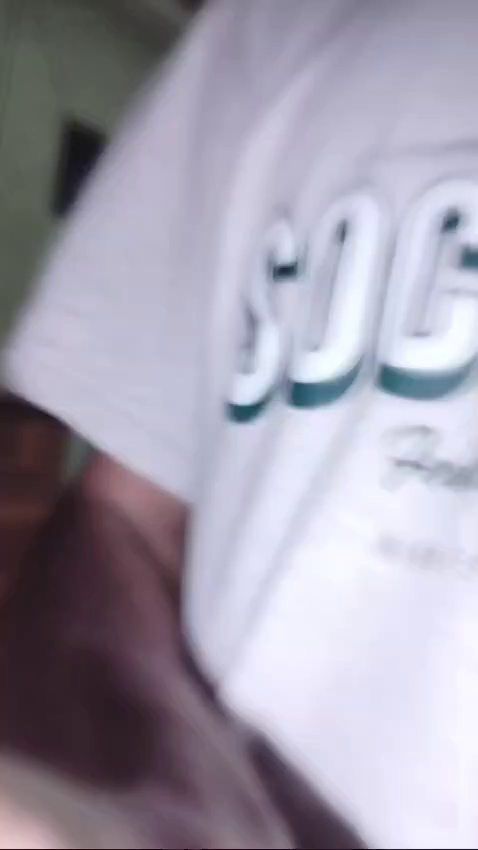

s False


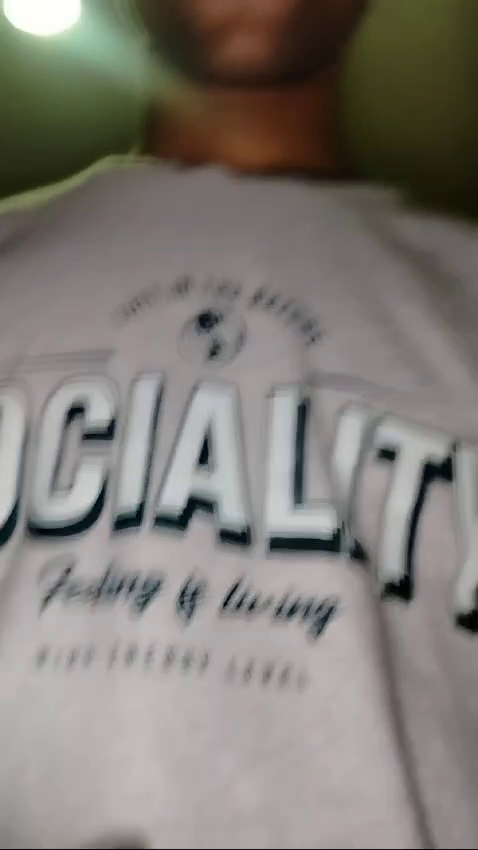

Motion detected at second 1
Action triggered at second 1
0.9279753886615929
s True


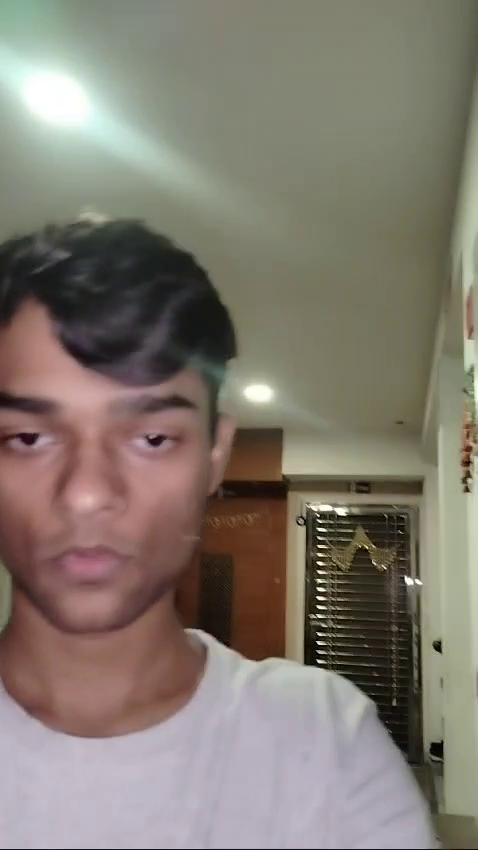

Motion detected at second 2
Action triggered at second 2
0.8562139295320144
s True


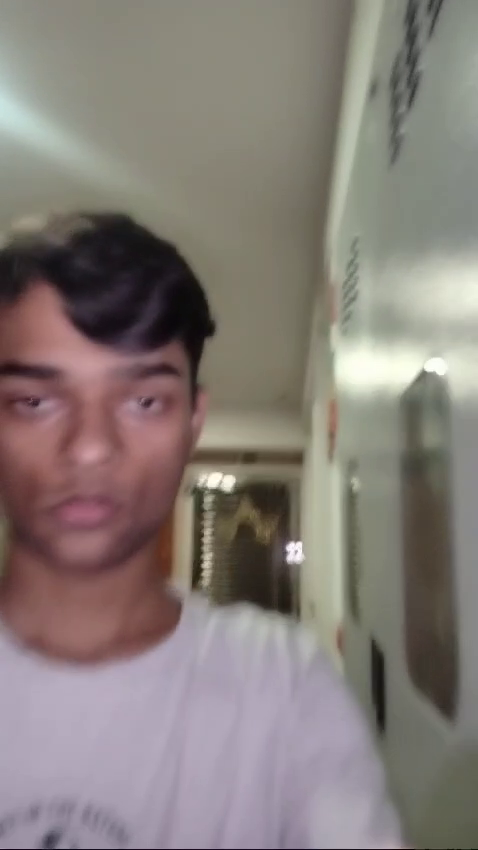

Motion detected at second 3
Action triggered at second 3
0.9262574253059245
s True


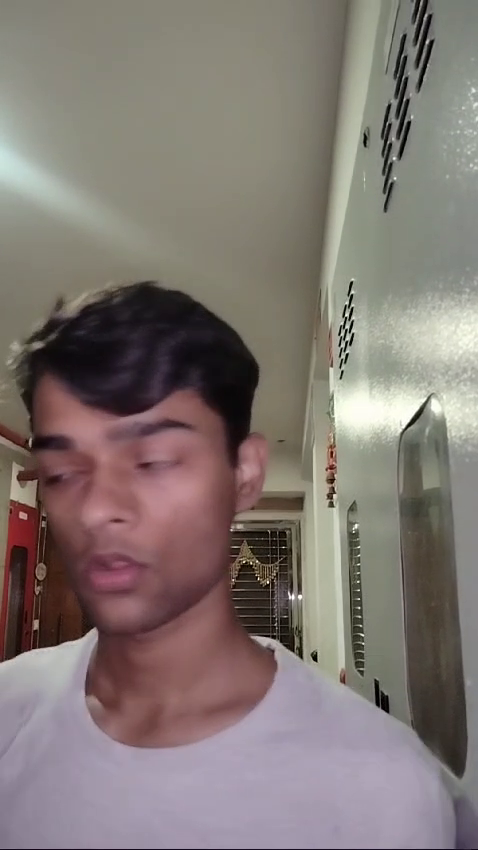

Motion detected at second 4
Action triggered at second 4
s False


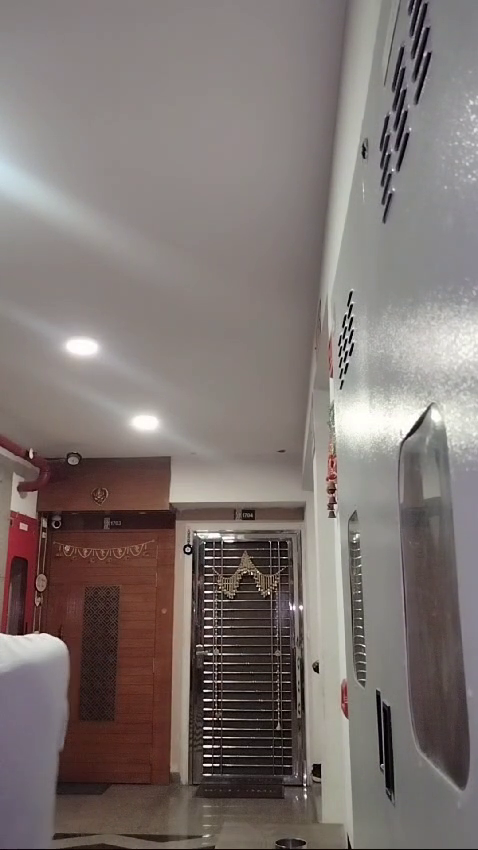

Motion detected at second 5
Action triggered at second 5
s False


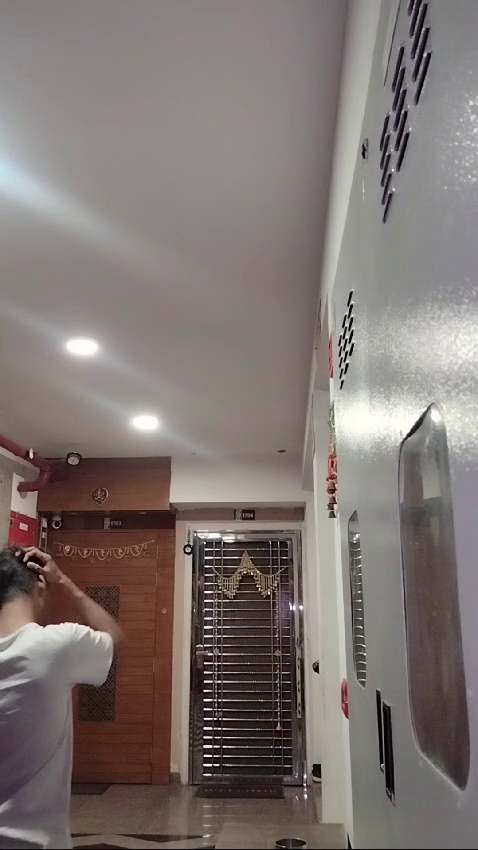

0.5508565703391438
s False


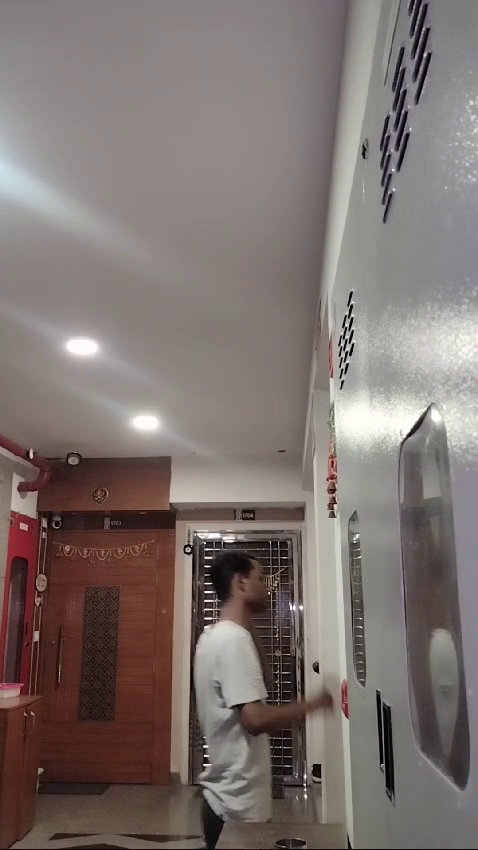

s False


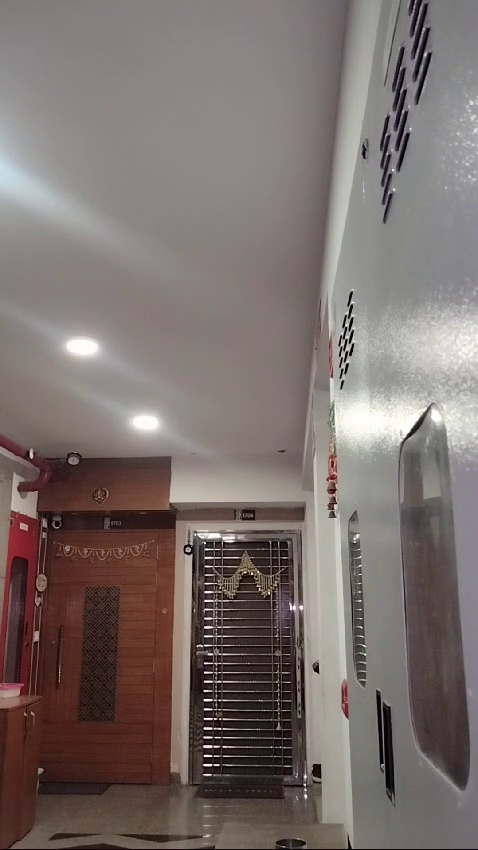

s False


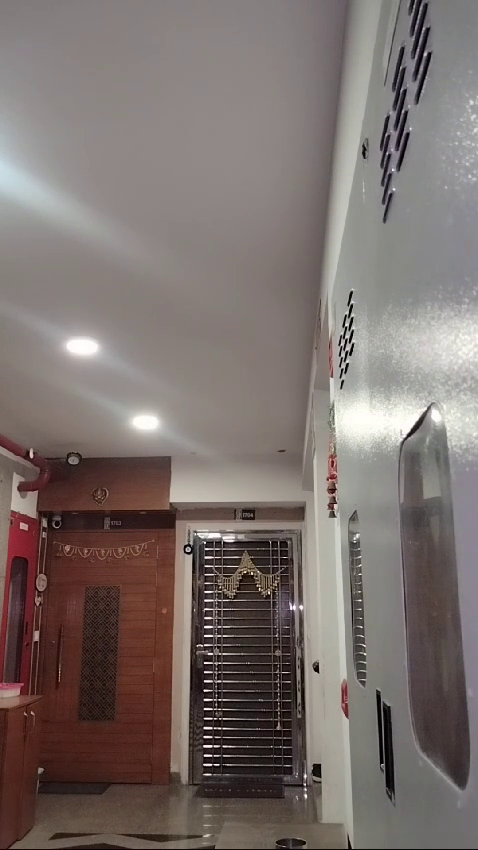

0.5935993910608705
s False


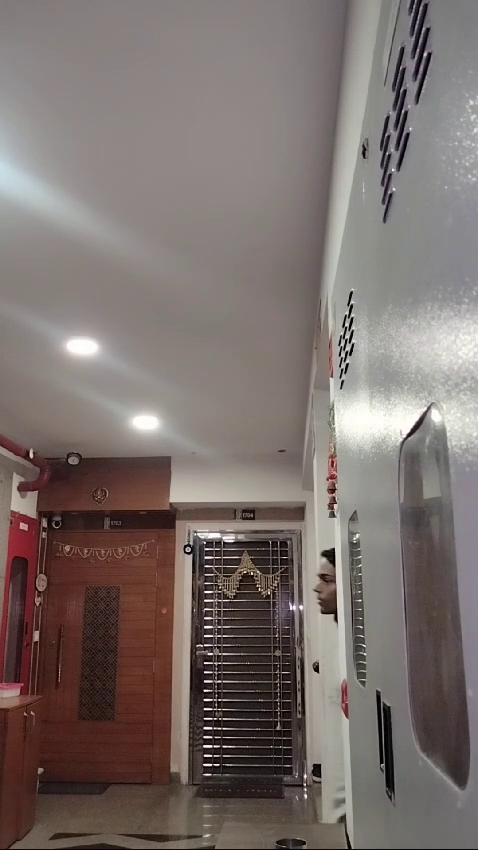

0.7533416563017931
s False


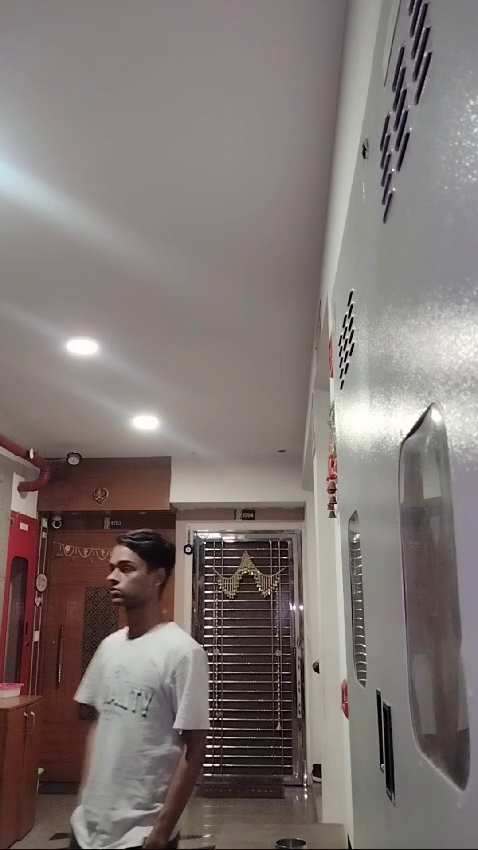

0.7074332888714729
s False


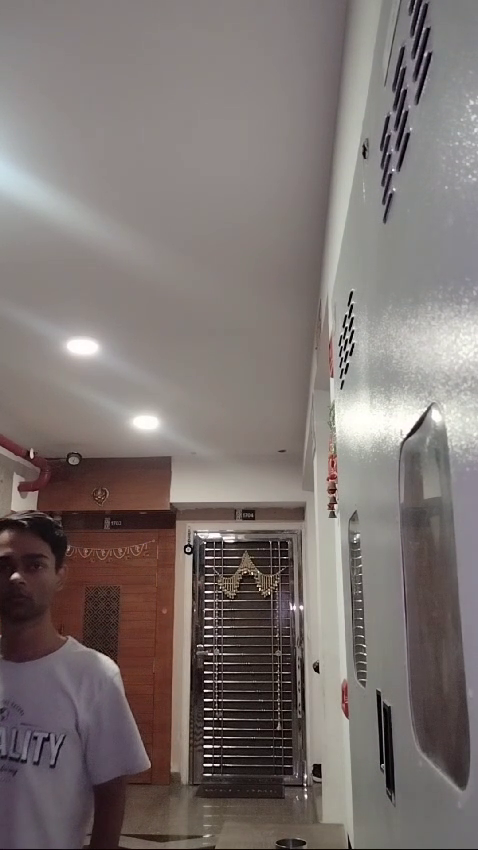

0.8924503467776566
s True


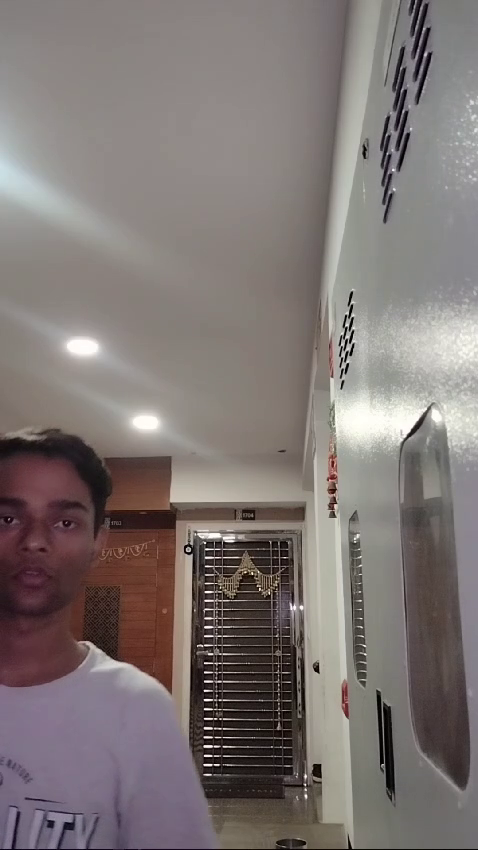

0.9365661103936747
s True


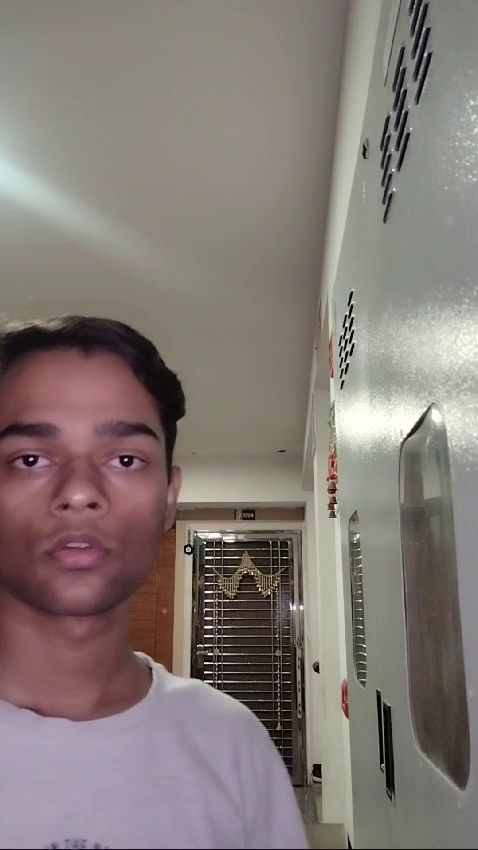

Motion detected at second 14
0.9262574253059245
found person
0.5508565703391438
0.5935993910608705
0.7533416563017931
0.7074332888714729
0.8924503467776566
found person
Action triggered at second 14
0.9148215532117692
s True


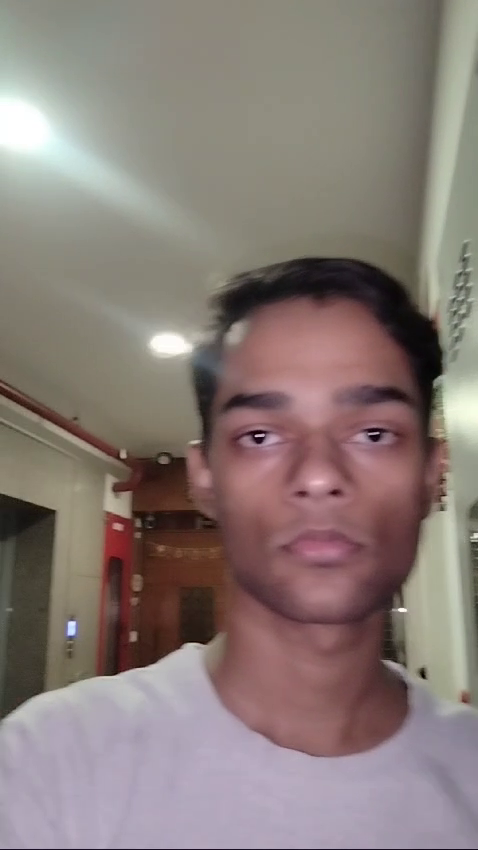

Motion detected at second 15
Action triggered at second 15
s False


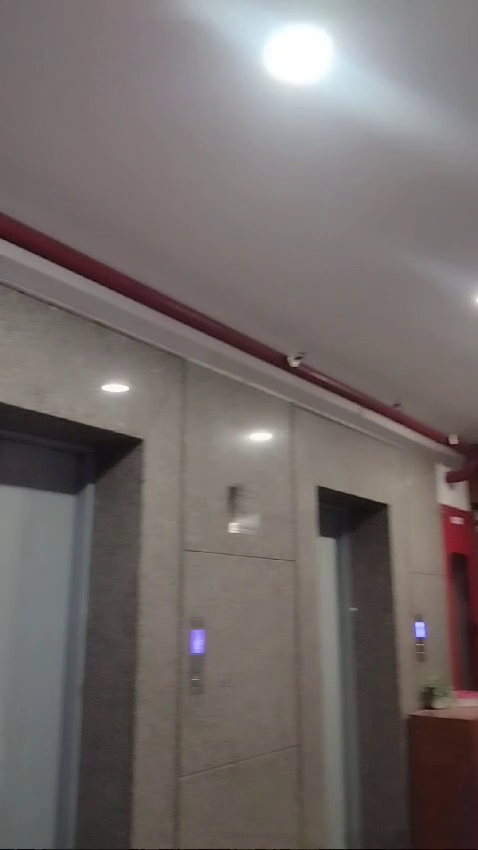

Motion detected at second 16
Action triggered at second 16
s False


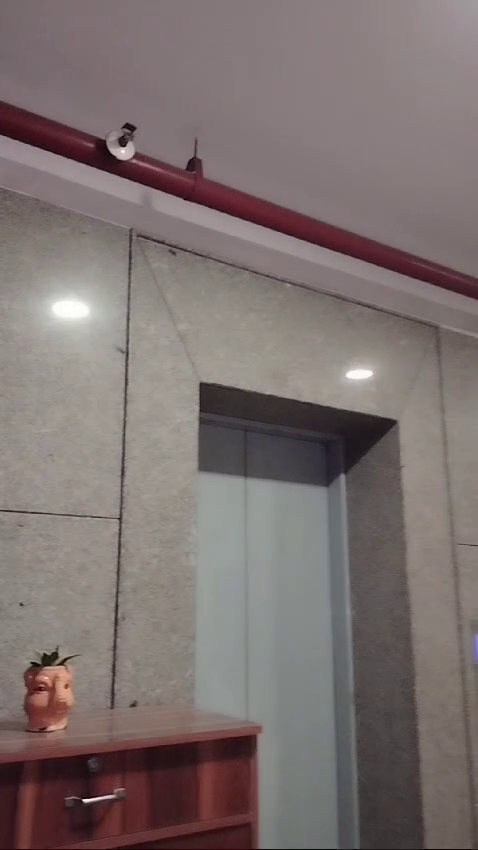

Motion detected at second 17
Action triggered at second 17
s False


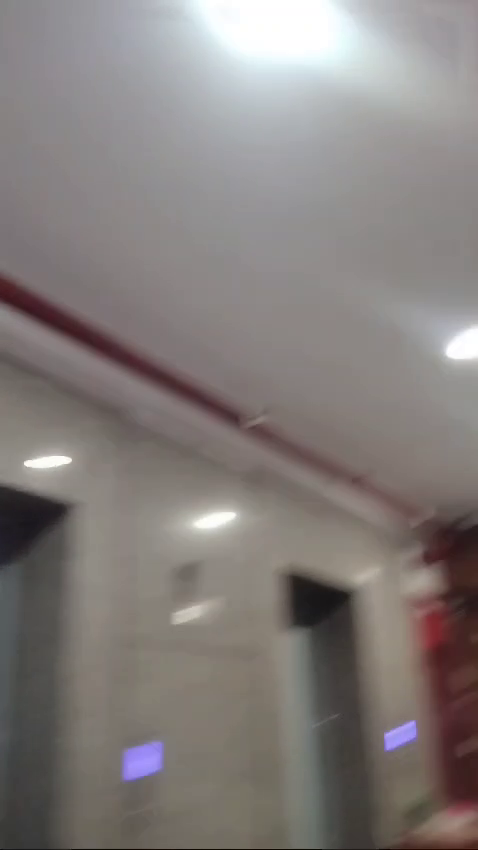

Motion detected at second 18
Action triggered at second 18
s False


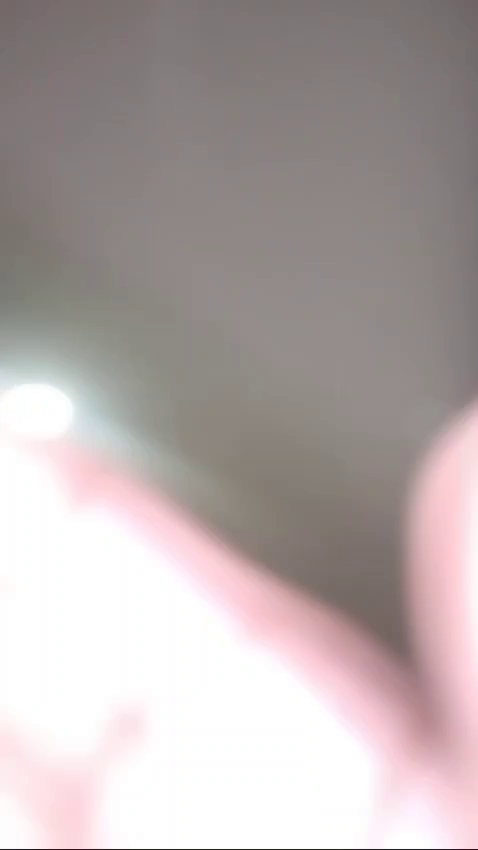

Motion detected at second 19
Action triggered at second 19
s False


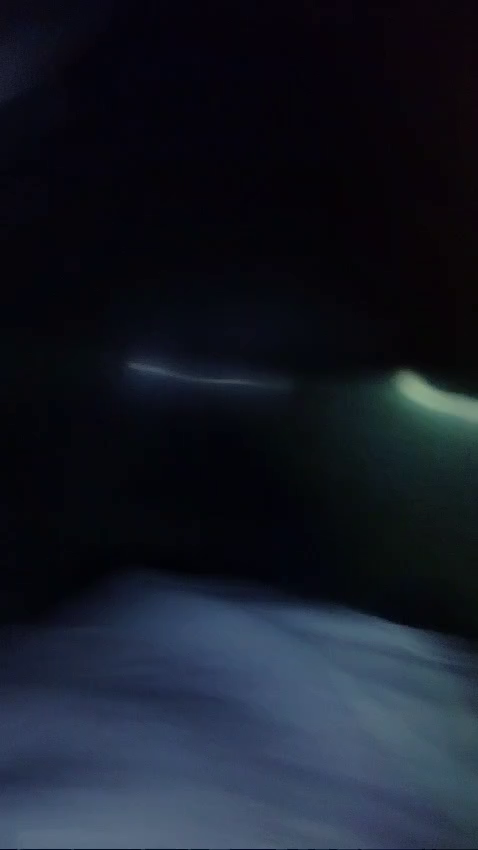

Motion detected at second 20
Action triggered at second 20


In [ ]:
process_video("/content/vid gate 3.mp4")